In [1]:
#import the library
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import seaborn as sns
import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

import importlib
import warnings
warnings.filterwarnings("ignore")

import pickle as pkl
from matplotlib.colors import LinearSegmentedColormap

In [ ]:
adata=sc.read_h5ad('/Tcell/LP/LP_ultimate_annotated_refined.h5ad')

In [4]:
def print_full(x):
    pd.set_option('display.max_rows', len(x))
    print(x)
    pd.reset_option('display.max_rows')

In [5]:
#This pallete is for colorblinds
my_palette = ['#0351A8','#8CB0E0','#D56D11','#FFBB78','#234E08','#53CB8B','#D30083','#CB788D','#4E195A','#C58CCF','#AA290F','#B03FD1','#E8BCCF','#64605F','#B2AD9A','#D2D30B','#D1BD4F','#06DCF2','#9EDAE5','#517219','#5B43CF','#D92F24','#FFD900','#002F33','#B8A3A3']

In [6]:
#This pallete is for colorblinds
negative1_palette = ['#808080','#8CB0E0','#D56D11','#FFBB78','#234E08','#53CB8B','#D30083','#CB788D','#4E195A','#C58CCF','#AA290F','#B03FD1','#E8BCCF','#64605F','#B2AD9A','#D2D30B','#D1BD4F','#06DCF2','#9EDAE5','#517219','#5B43CF','#D92F24','#FFD900','#002F33','#B8A3A3']

In [6]:
from matplotlib.colors import LinearSegmentedColormap
values = [0,1]
colors = [(227, 227, 227), (255, 42, 18)]
norm = plt.Normalize(min(values), max(values))
my_cmap = LinearSegmentedColormap.from_list(
    '', [(norm(value), tuple(np.array(color) / 255)) for value, color in zip(values, colors)])

In [ ]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

In [ ]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
.libPaths(.libPaths('C:\\Users\\16220\\AppData\\Local\\R\\win-library\\4.3'))

# Load all the R libraries we will be using in the notebook
library(scran)
library(Seurat)
library(RColorBrewer)
library(slingshot)
library(monocle)
library(gam)
library(ggplot2)
library(plyr)
library(MAST)
library(clusterExperiment)
library(monocle3)

In [29]:
adata3 = sc.read_10x_h5('3/sample_filtered_feature_bc_matrix.h5')
adata4 = sc.read_10x_h5('4/sample_filtered_feature_bc_matrix.h5')
adata5 = sc.read_10x_h5('5/sample_filtered_feature_bc_matrix.h5')
adata3.var_names_make_unique()
adata4.var_names_make_unique()
adata5.var_names_make_unique()

reading 3/sample_filtered_feature_bc_matrix.h5
 (0:00:00)
reading 4/sample_filtered_feature_bc_matrix.h5
 (0:00:00)
reading 5/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


In [30]:
TCR_info3 = scirpy.io.read_10x_vdj('3/filtered_contig_annotations.csv')
TCR_info4 = scirpy.io.read_10x_vdj('4/filtered_contig_annotations.csv')
TCR_info5 = scirpy.io.read_10x_vdj('5/filtered_contig_annotations.csv')

In [31]:
TCR_info3_pd =pd.read_csv('3/filtered_contig_annotations.csv')
TCR_info4_pd = pd.read_csv('4/filtered_contig_annotations.csv')
TCR_info5_pd = pd.read_csv('5/filtered_contig_annotations.csv')

In [32]:
adata_group = [adata3,adata4,adata5]
TCR_group = [TCR_info3,TCR_info4,TCR_info5]
TCR_list = [TCR_info3_pd,TCR_info4_pd, TCR_info5_pd]

In [33]:
for i in range(0,len(adata_group)):
    
    scirpy.pp.merge_with_ir(adata_group[i],TCR_group[i])
    scirpy.tl.chain_qc(adata_group[i])
    
    TCR_info_a = TCR_list[i][TCR_list[i]['chain']=='TRA']
    TCR_info_a.index = TCR_info_a['barcode']
    TCR_info_b = TCR_list[i][TCR_list[i]['chain']=='TRB']
    TCR_info_b.index = TCR_info_b['barcode']
    
    adata_group[i].obs['cdr1a']=''
    adata_group[i].obs['cdr2a']=''
    adata_group[i].obs['cdr3a']=''
    adata_group[i].obs['cdr1b']=''
    adata_group[i].obs['cdr2b']=''
    adata_group[i].obs['TRAJ']=''
    adata_group[i].obs['TRAV']=''
    adata_group[i].obs['TRBV']=''
    adata_group[i].obs['TRBJ']=''
    
    barcodes = adata_group[i][adata_group[i].obs["chain_pairing"].isin(["single pair", "extra VJ","extra VDJ","two full chains"]), :].obs_names
    for j in barcodes:
        if adata_group[i].obs.loc[j,'chain_pairing'] == 'single pair':

            adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
            adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
            adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
            adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']

            
            adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
            adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
            adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
            adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
            adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
            adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
        elif adata_group[i].obs.loc[j,'chain_pairing'] == 'extra VJ':
            if adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
        elif adata_group[i].obs.loc[j,'chain_pairing'] == 'extra VDJ':
            if adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
        else:
            if adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            elif adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] < adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
            elif adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] < adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
    adata_group[i].obs = adata_group[i].obs[['has_ir','chain_pairing','TRAV','TRAJ','TRBV','TRBJ','cdr1a','cdr2a','cdr3a','cdr1b','cdr2b','cdr3b']]

Number of cells before T filter: 7630
Number of cells after T filter: 6328
Number of cells before T filter: 6431
Number of cells after T filter: 5733
Number of cells before T filter: 6583
Number of cells after T filter: 5171


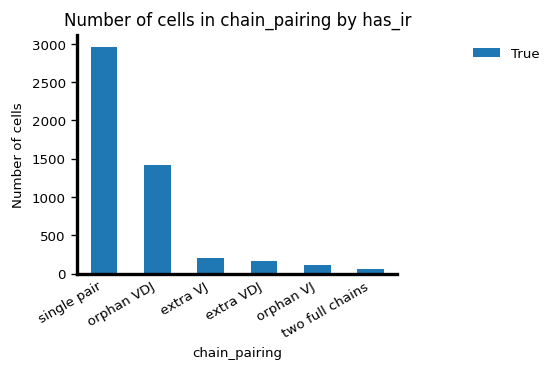

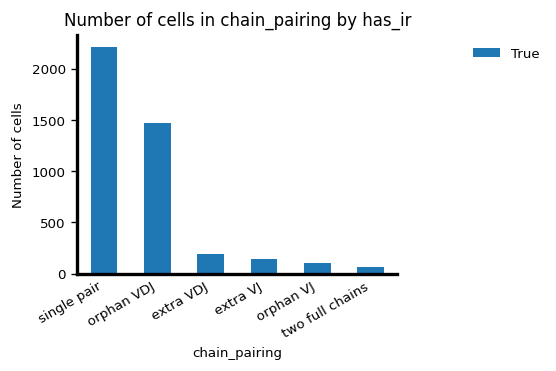

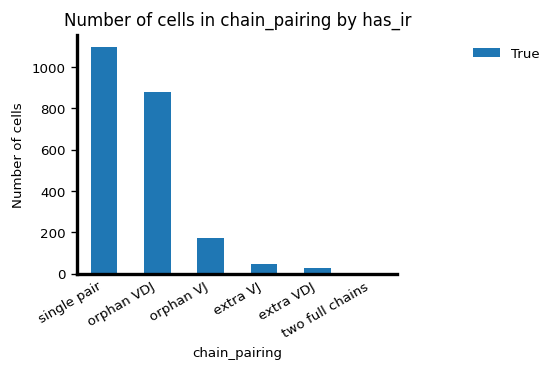

In [34]:
for i in range(0,len(adata_group)): 
    adata_group[i].obs['n_counts'] = adata_group[i].X.sum(1)
    adata_group[i].obs['log_counts'] = np.log(adata_group[i].obs['n_counts'])
    adata_group[i].obs['n_genes'] = (adata_group[i].X > 0).sum(1)

    mt_gene_mask = [gene.startswith('MT-') for gene in adata_group[i].var_names]
    adata_group[i].obs['mt_frac'] = np.array(adata_group[i].X[:, mt_gene_mask].sum(1).ravel())[0]/adata_group[i].obs['n_counts']
    ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata_group[i].var_names]
    adata_group[i].obs['ribo_frac'] = np.array(adata_group[i].X[:, ribo_gene_mask].sum(1).ravel())[0]/adata_group[i].obs['n_counts']
    print('Number of cells before T filter: {:d}'.format(adata_group[i].n_obs))
    
    cd3s = [z for z in ["CD3D","CD3E","CD3G","CD3Z"] if z in adata_group[i].var_names]
    adata_group[i] = adata_group[i][(adata_group[i][:,cd3s].X.A>0).any(axis = 1) == True,:]
    adata_group[i] = adata_group[i][np.array(adata_group[i][:,'CD19'].X.A==0),:]
    print('Number of cells after T filter: {:d}'.format(adata_group[i].n_obs))
    
    adata_group[i].uns['scirpy_version'] = '0.7'
    scirpy.pl.group_abundance(adata_group[i], groupby="chain_pairing")

In [35]:
for i in range(0,len(adata_group)):
    adata_group[i].write('donor'+str(i)+'matched'+'.h5ad')

### 3 QC

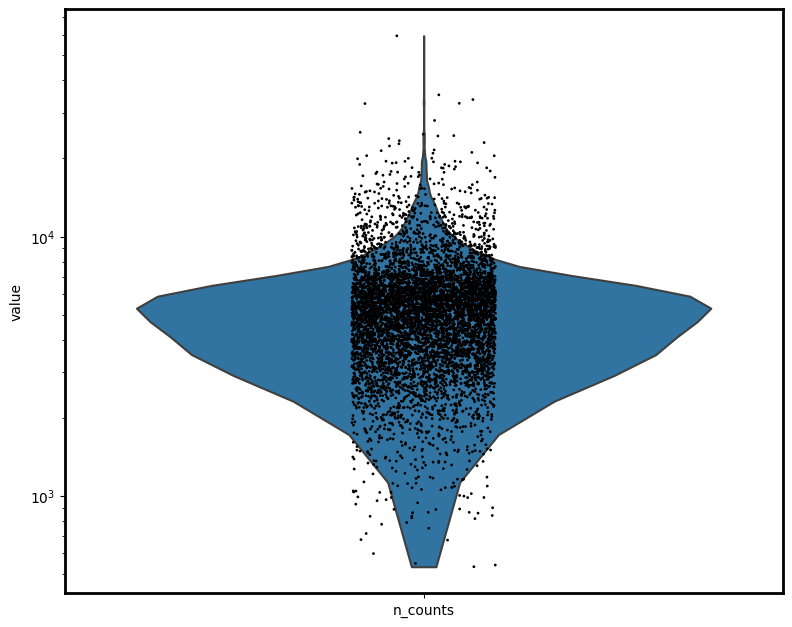

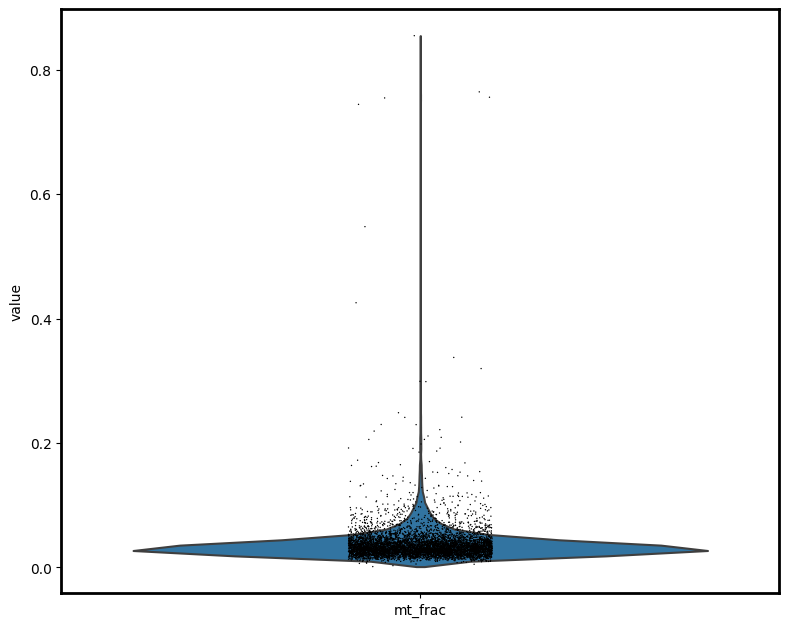

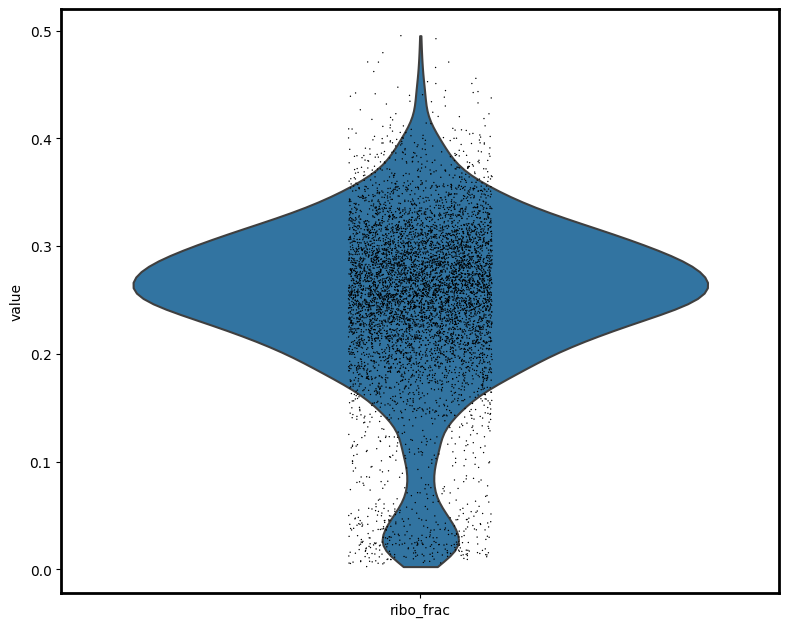

In [36]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[0], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[0], 'mt_frac')
t3 = sc.pl.violin(adata_group[0], 'ribo_frac')

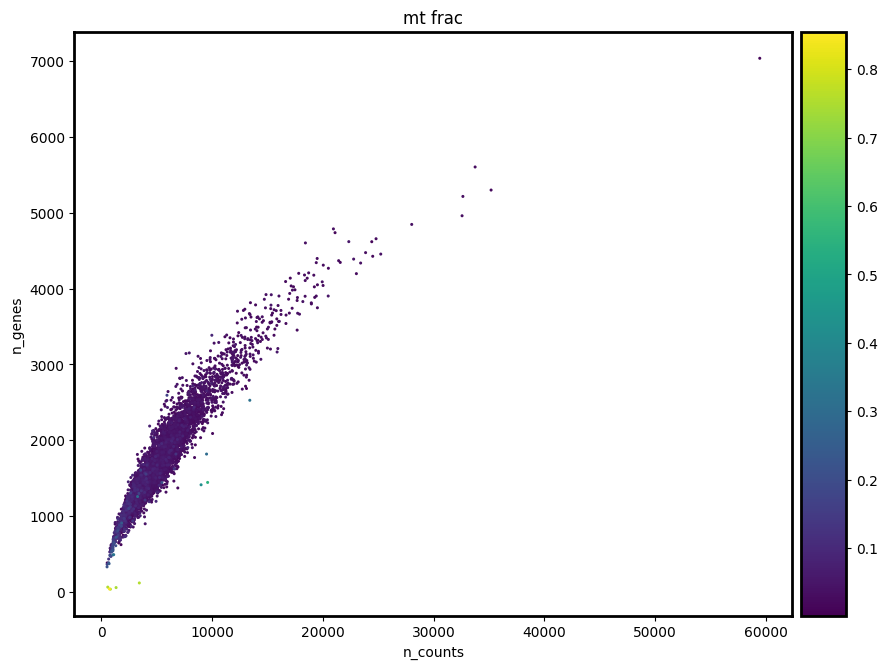

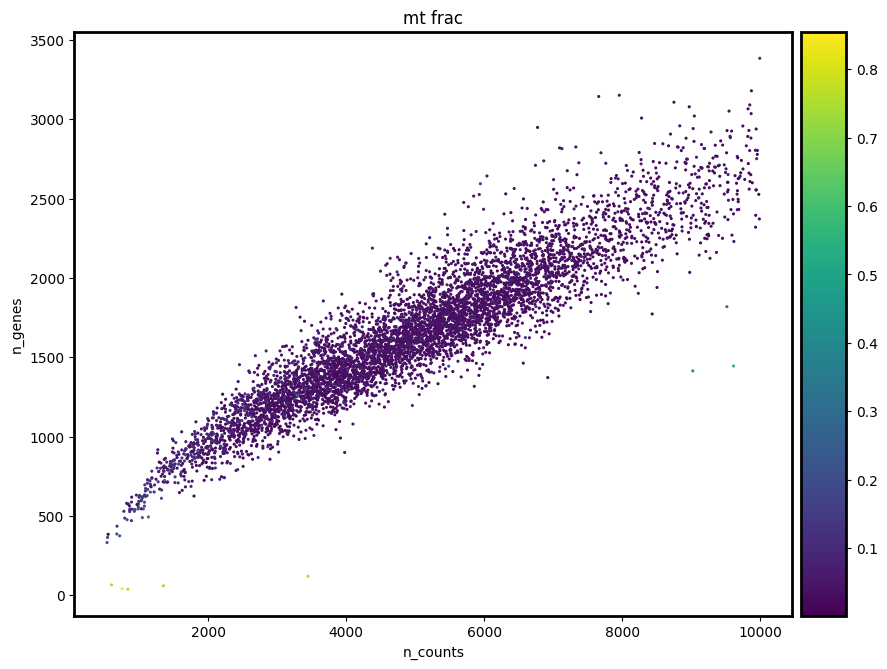

In [37]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[0], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[0][adata_group[0].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

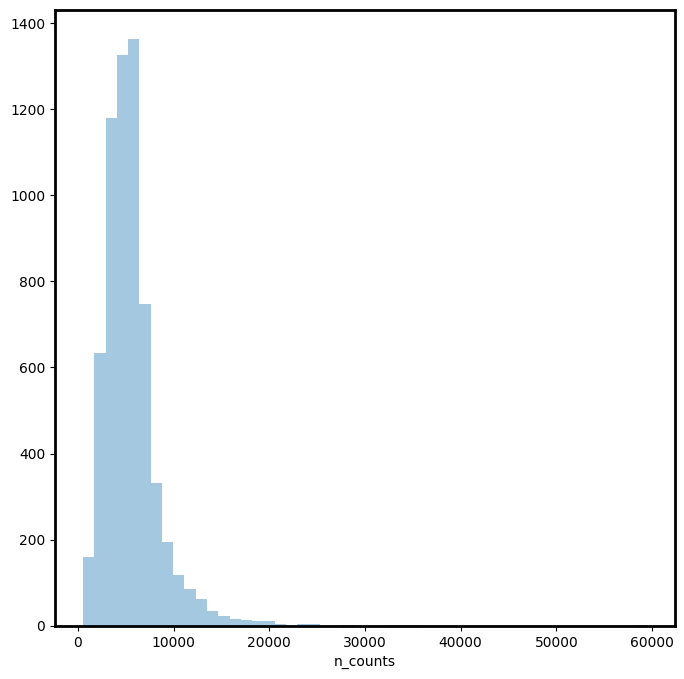

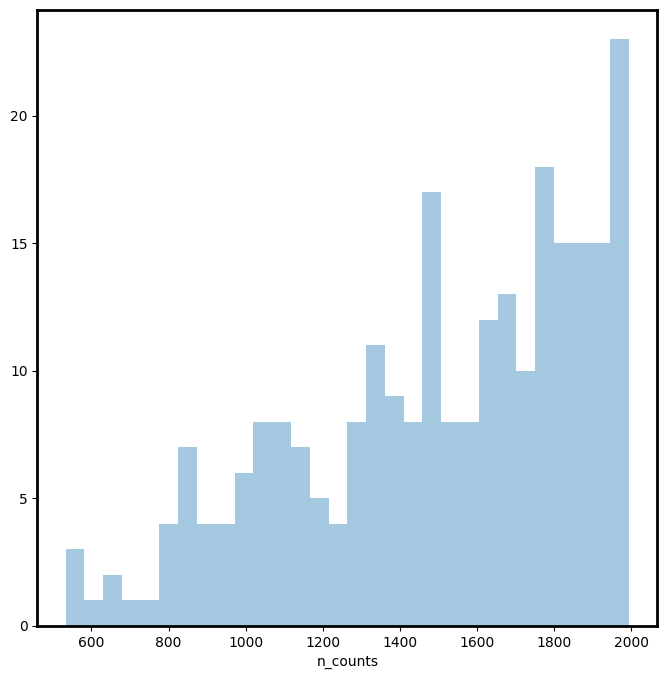

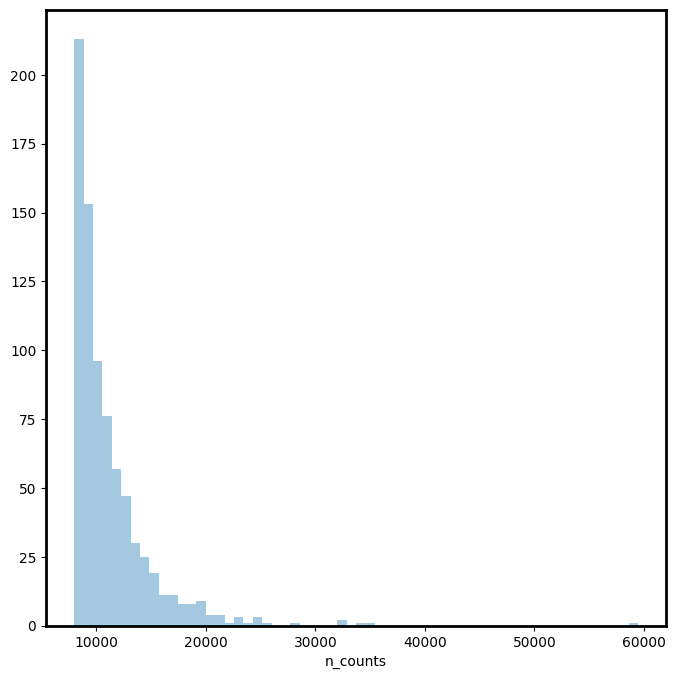

In [38]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[0].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[0].obs['n_counts'][adata_group[0].obs['n_counts']<2000], kde=False, bins=30)
plt.show()

p5 = sns.distplot(adata_group[0].obs['n_counts'][adata_group[0].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

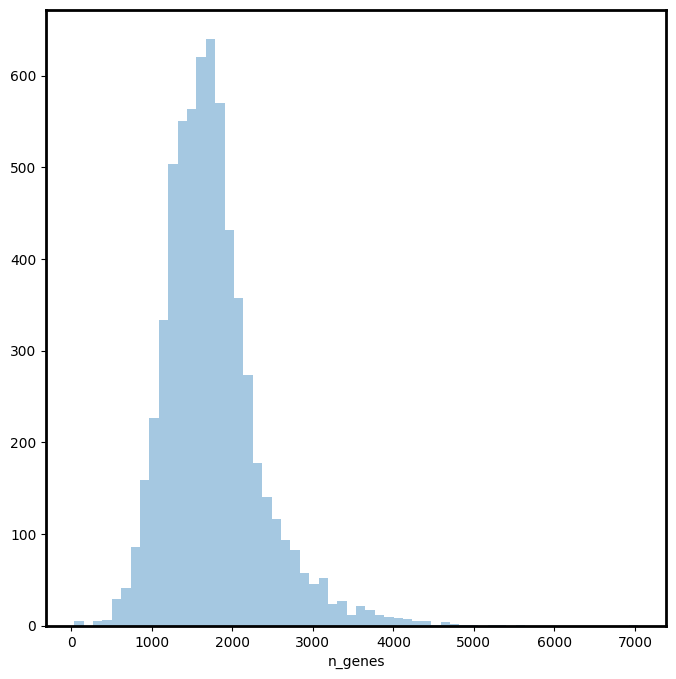

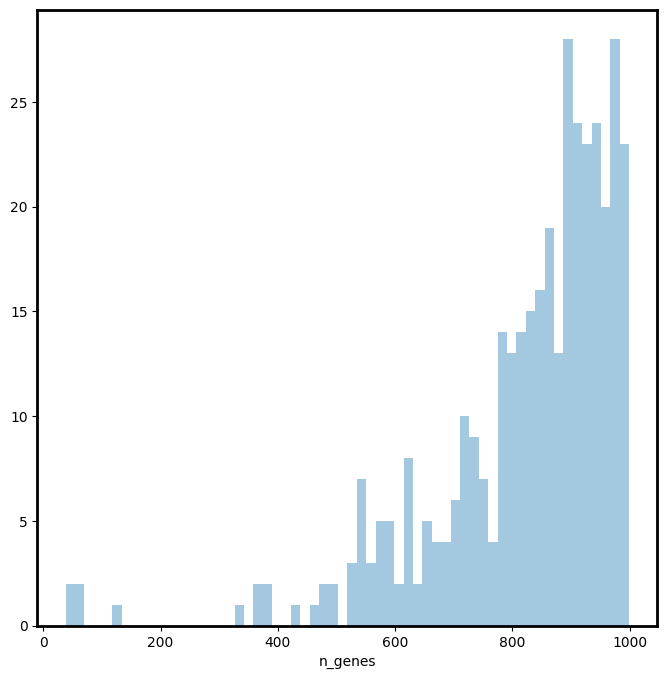

In [39]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[0].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[0].obs['n_genes'][adata_group[0].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [40]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[0].n_obs))

sc.pp.filter_cells(adata_group[0], min_counts = 700)
print('Number of cells after min count filter: {:d}'.format(adata_group[0].n_obs))


adata_group[0] = adata_group[0][adata_group[0].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[0].n_obs))

sc.pp.filter_cells(adata_group[0], min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata_group[0].n_obs))

Total number of cells: 6328
filtered out 6 cells that have less than 700 counts
Number of cells after min count filter: 6322
Number of cells after MT filter: 6302
Number of cells after gene filter: 6302


In [41]:
import doubletdetection
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[0].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [42]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[0].n_obs))
adata_group[0] = adata_group[0][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[0].n_obs))

Number of cells before doublet filter: 6302
Number of cells after doublet filter: 5914


### 4 QC

In [43]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[1], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[1], 'mt_frac')
t3 = sc.pl.violin(adata_group[1], 'ribo_frac')

In [44]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[1], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[1][adata_group[1].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

In [45]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[1].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[1].obs['n_counts'][adata_group[1].obs['n_counts']<2000], kde=False, bins=30)
plt.show()

p5 = sns.distplot(adata_group[1].obs['n_counts'][adata_group[1].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

In [46]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[1].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[1].obs['n_genes'][adata_group[1].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [47]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[1].n_obs))

sc.pp.filter_cells(adata_group[1], min_counts = 700)
print('Number of cells after min count filter: {:d}'.format(adata_group[1].n_obs))

adata_group[1] = adata_group[1][adata_group[1].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[1].n_obs))


sc.pp.filter_cells(adata_group[1], min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata_group[1].n_obs))

Total number of cells: 5733
filtered out 25 cells that have less than 700 counts
Number of cells after min count filter: 5708
Number of cells after MT filter: 5699
Number of cells after gene filter: 5699


In [48]:
import doubletdetection
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[1].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [49]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[1].n_obs))
adata_group[1] = adata_group[1][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[1].n_obs))

Number of cells before doublet filter: 5699
Number of cells after doublet filter: 5225


### 5 QC

In [50]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[2], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[2], 'mt_frac')
t3 = sc.pl.violin(adata_group[2], 'ribo_frac')

In [51]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[2], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[2][adata_group[2].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

In [52]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[2].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[2].obs['n_counts'][adata_group[2].obs['n_counts']<2000], kde=False, bins=30)
plt.show()

p5 = sns.distplot(adata_group[2].obs['n_counts'][adata_group[2].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

In [53]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[2].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[2].obs['n_genes'][adata_group[2].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [54]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[2].n_obs))

sc.pp.filter_cells(adata_group[2], min_counts = 900)
print('Number of cells after min count filter: {:d}'.format(adata_group[2].n_obs))

adata_group[2] = adata_group[2][adata_group[2].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[2].n_obs))

sc.pp.filter_cells(adata_group[2], min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata_group[2].n_obs))


Total number of cells: 5171
filtered out 17 cells that have less than 900 counts
Number of cells after min count filter: 5154
Number of cells after MT filter: 5150
Number of cells after gene filter: 5150


In [55]:
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[2].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [56]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[2].n_obs))
adata_group[2] = adata_group[2][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[2].n_obs))

Number of cells before doublet filter: 5150
Number of cells after doublet filter: 4872


### concat

In [57]:
adata_concat = adata_group[0].concatenate(adata_group[1],adata_group[2], batch_categories=['3', '4','5'])

In [58]:
sc.pp.filter_genes(adata_concat, min_cells = 2)

filtered out 12900 genes that are detected in less than 2 cells


In [59]:
adata_concat.layers['raw_filtered'] = adata_concat.X

In [60]:
adata_concat.obs['n_counts'] = adata_concat.X.sum(1)
adata_concat.obs['log_counts'] = np.log(adata_concat.obs['n_counts'])
adata_concat.obs['n_genes'] = (adata_concat.X > 0).sum(1)

mt_gene_mask = [gene.startswith('MT-') for gene in adata_concat.var_names]
adata_concat.obs['mt_frac'] = np.array(adata_concat.X[:, mt_gene_mask].sum(1).ravel())[0]/adata_concat.obs['n_counts']
ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata_concat.var_names]
adata_concat.obs['ribo_frac'] = np.array(adata_concat.X[:, ribo_gene_mask].sum(1).ravel())[0]/adata_concat.obs['n_counts']

In [61]:
adata_forcycle = adata_concat.copy()
sc.pp.normalize_total(adata_forcycle, key_added = 'normalization_factors')
sc.pp.log1p(adata_forcycle)

normalizing counts per cell
    finished (0:00:00)


### Find HVG and proceed to dimesion reduction PCA + UMAP

In [62]:
sc.pp.highly_variable_genes(adata_forcycle, flavor='seurat', n_top_genes=2000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_forcycle.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 2000


In [63]:
sc.pp.pca(adata_forcycle, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_forcycle, n_neighbors = 15, n_pcs = 50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)


In [64]:
sc.tl.umap(adata_forcycle, min_dist = 0.2, spread = 1)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


### Use the cell cycle gene list summarized by Triosh et al. to calculate the cc score

In [65]:
cc_genes = pd.read_excel('Triosh_cc.xlsx')

In [66]:
s_genes = cc_genes['G1/S'].dropna()
g2m_genes = cc_genes['G2/M'].dropna()

s_genes_mm_ens = adata_forcycle.var_names[np.in1d(adata_forcycle.var_names, s_genes)]
g2m_genes_mm_ens = adata_forcycle.var_names[np.in1d(adata_forcycle.var_names, g2m_genes)]

In [67]:
sc.tl.score_genes_cell_cycle(adata_forcycle, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    670 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    711 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


### Visualize the cell phases of the co-cultured cells

In [68]:
sc.pl.umap(adata_forcycle, color='phase',size = 12)

In [69]:
sc.pl.umap(adata_forcycle, color='batch',size = 10)

In [70]:
sc.pl.umap(adata_forcycle, color='RORC',size = 30)

### Export the result to input it into the Seurat

In [71]:
Sscore = adata_forcycle.obs['S_score'].values.tolist()
G2Mscore = adata_forcycle.obs['G2M_score'].values.tolist()
S_G2M_diff = adata_forcycle.obs['S_score'] - adata_forcycle.obs['G2M_score']
S_G2M_diff = S_G2M_diff.values.tolist()

In [72]:
adata_concat.uns['allgenes'] = list(adata_concat.var_names)
adata_concat.obs['S_score'] = adata_forcycle.obs['S_score']
adata_concat.obs['G2M_score'] = adata_forcycle.obs['G2M_score']
adata_concat.obs['S_G2M_diff'] = adata_concat.obs['S_score'] - adata_concat.obs['G2M_score']
adata_concat.obs['phase'] = adata_forcycle.obs['phase']

In [73]:
colnames = adata_concat.obs_names
rownames = adata_concat.var_names
mt_frac = adata_concat.obs['mt_frac']
batch = adata_concat.obs['batch']
counts = adata_concat.X.T

In [74]:
%%R -i counts -i colnames -i rownames -i S_G2M_diff -i mt_frac -i Sscore -i G2Mscore -i batch
colnames(counts) = colnames
rownames(counts) = rownames

srat <- CreateSeuratObject(counts = counts, project = "IEL", min.cells = 0, min.features = 0, assay = "RNA")

srat[["S_G2M_diff"]] = S_G2M_diff
srat[["mt_frac"]] = mt_frac
srat[["Sscore"]] = Sscore
srat[["G2Mscore"]] = G2Mscore
srat[["batch"]] = batch

In [75]:
%%R
cond.list = SplitObject(srat, split.by = "batch")
d3 <- cond.list[["3"]]
d4 <- cond.list[["4"]]
d5 <- cond.list[["5"]]

d3 = SCTransform(object = d3, verbose = FALSE, vst.flavor = "v2", vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d3 = RunPCA(d3, verbose = FALSE)

d4 = SCTransform(object = d4, verbose = FALSE, vst.flavor = "v2", vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d4 = RunPCA(d4, verbose = FALSE)

d5 = SCTransform(object = d5, verbose = FALSE, vst.flavor = "v2", vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d5 = RunPCA(d5, verbose = FALSE)

In [76]:
%%R
ifnb.list <- list(d3 = d3, d4 = d4, d5 = d5)
features <- SelectIntegrationFeatures(object.list = ifnb.list, nfeatures = 3000)
ifnb.list <- PrepSCTIntegration(object.list = ifnb.list, anchor.features = features)

mod.anchors <- FindIntegrationAnchors(object.list = ifnb.list, normalization.method = "SCT",
    anchor.features = features)
srat_combined <- IntegrateData(anchorset = mod.anchors, normalization.method = "SCT")

  |                                                  | 0 % ~calculating   |+++++++++++++++++                                 | 33% ~04s           |++++++++++++++++++++++++++++++++++                | 67% ~02s           |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=05s  
  |                                                  | 0 % ~calculating   |+++++++++++++++++                                 | 33% ~04m 42s       |++++++++++++++++++++++++++++++++++                | 67% ~02m 17s       |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=06m 34s


In [77]:
%%R -o HVG -o varExplained -o PCs -o mat -o adata_transformed -o left_genes

srat_combined = RunPCA(srat_combined,verbose = FALSE)

HVG = VariableFeatures(srat_combined)

mat <- Seurat::GetAssayData(object = srat_combined, slot = 'scale.data')
pca <- srat_combined[["pca"]]

# Get the total variance:
total_variance <- sum(matrixStats::rowVars(mat))

eigValues = (pca@stdev)^2  ## EigenValues
varExplained = eigValues / total_variance

PCs = Loadings(srat_combined, reduction = "pca")

adata_transformed = as.SingleCellExperiment(srat_combined)
left_genes = rownames(x = srat_combined[["SCT"]])

In [78]:
%%R -o counts -o logcounts -o residuals

counts = srat_combined[["SCT"]]@counts
logcounts = srat_combined[["SCT"]]@data
residuals = srat_combined[["SCT"]]@scale.data

In [79]:
%R -o srat_combined -o features

In [80]:
import anndata
adata = anndata.AnnData(X = logcounts.T)
adata.var_names = left_genes
adata.obs_names = adata_transformed.obs_names
adata.obs = adata_concat.obs
adata.uns['scaled'] = mat.T
adata.layers['counts'] = counts.T
adata.uns['residuals'] = residuals.T
adata.layers['logcounts'] = logcounts.T
adata.layers['raw'] = adata_concat.layers['raw_filtered']
adata.obsm['X_pca'] = adata_transformed.obsm['X_pca']

In [81]:
adata.obs['n_counts'] = adata.layers['counts'].sum(1)
adata.obs['n_genes'] = (adata.layers['counts'] > 0).sum(1)
adata.var['highly_variable'] = adata.var_names.isin(HVG)
adata.obs['phase'] = adata_concat.obs['phase']
adata.uns['pca'] = dict({'variance_ratio': varExplained})

In [82]:
adata.varm['PCs'] = np.zeros([np.shape(adata.X.A)[1],50])
for i in range(0,50):
    genename = HVG[i]
    adata.varm['PCs'][adata.var_names == genename,:] = PCs[i,:]

In [83]:
adata.obs['n_counts'] = adata.layers['counts'].sum(1)
adata.obs['n_genes'] = (adata.layers['counts'] > 0).sum(1)
adata.var['highly_variable'] = adata.var_names.isin(HVG)
adata.obs['phase'] = adata_concat.obs['phase']
adata.uns['pca'] = dict({'variance_ratio': varExplained})

In [84]:
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = np.array(adata.layers['counts'][:, mt_gene_mask].sum(1).ravel())[0]/adata.obs['n_counts']

In [85]:
ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata.var_names]
adata.obs['ribo_frac'] = np.array(adata.layers['counts'][:, ribo_gene_mask].sum(1).ravel())[0]/adata.obs['n_counts']

In [86]:
sc.pp.neighbors(adata, n_pcs = 50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [87]:
sc.tl.leiden(adata, resolution = 0.8, key_added= 'leiden')
sc.pl.pca(adata, color='leiden', legend_loc = 'on data')

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [88]:
sc.tl.paga(adata, groups='leiden')
sc.pl.paga(adata,threshold = 0.5, labels=None, fontsize = 10, fontoutline = 3,node_size_scale = 3,node_size_power = 1,random_state = 0)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


In [89]:
sc.tl.umap(adata, min_dist = 0.01, spread = 2,init_pos = 'paga')
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color = ['batch','leiden'],size = 50, legend_loc = 'on data', palette  = my_palette, ncols = 4, cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_withunmatched.png')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


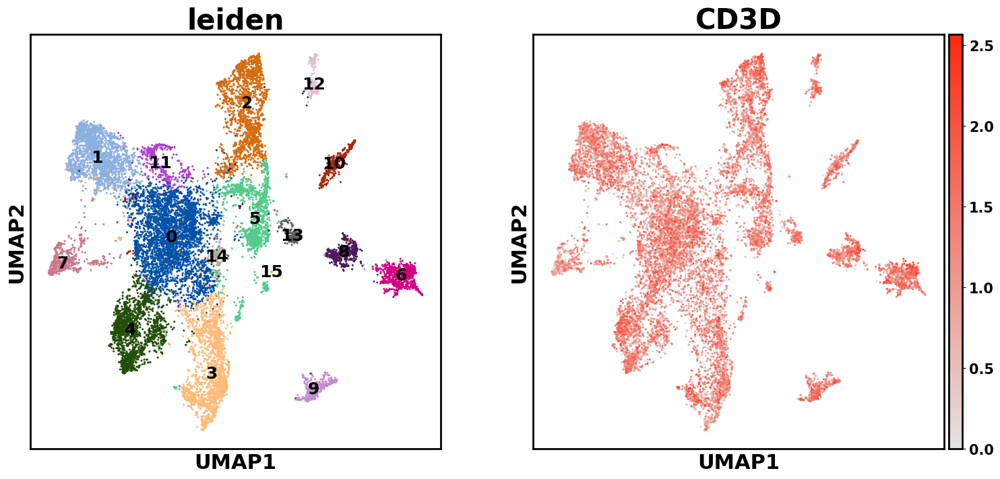

In [99]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','CD3D'],size =20, ncols = 4, cmap = my_cmap, palette  = my_palette,legend_loc = 'on data',return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_T.png')

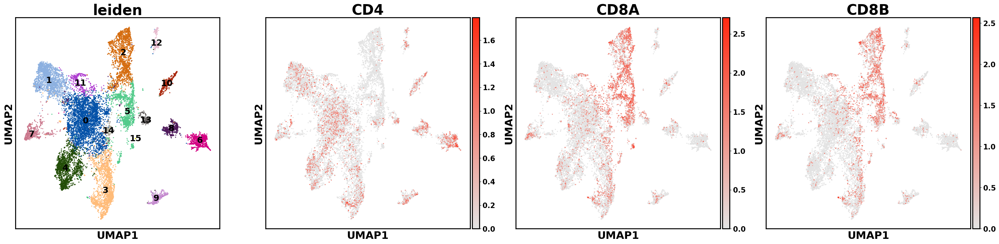

In [100]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','CD4','CD8A','CD8B'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_48.png')

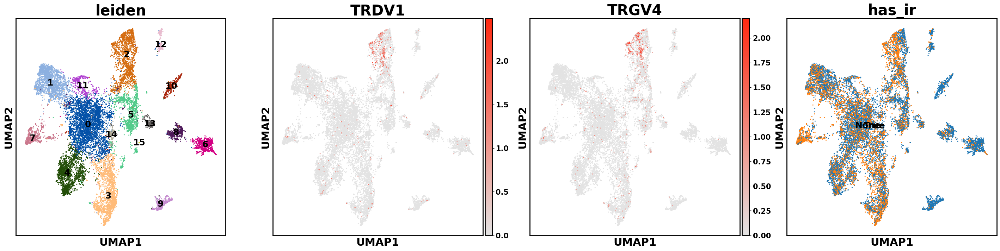

In [101]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['figure.figsize'] = [8,8]
fig = sc.pl.umap(adata, color=['leiden','TRDV1','TRGV4','has_ir'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_TCR.png')

In [102]:
adata.obs['has_ir_q']= adata.obs['has_ir'] == 'True'
adata.obs['has_ir_q']=adata.obs['has_ir_q'].values*1

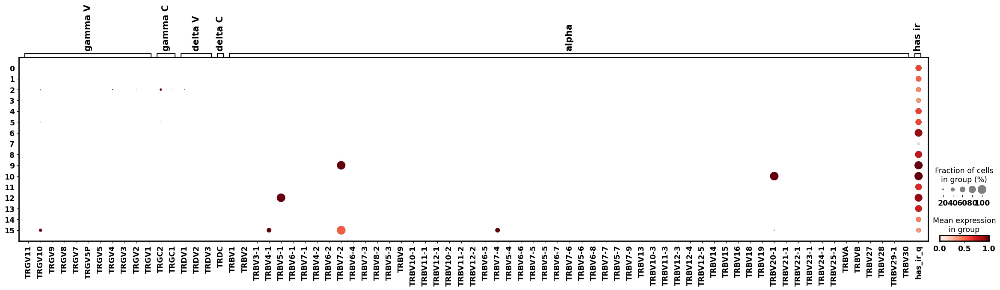

In [103]:
plt.rcParams.update({'font.size': 15, 'font.weight': 'heavy','axes.linewidth':2})
#plt.rcParams.update(plt.rcParamsDefault)
gamma_genesmask = [gene.startswith("TRGV") for gene in adata.var_names]
gamma_genes = adata.var_names[gamma_genesmask]
gammac_genesmask = [gene.startswith("TRGC") for gene in adata.var_names]
gammac_genes = adata.var_names[gammac_genesmask]
delta_genesmask = [gene.startswith("TRDV") for gene in adata.var_names]
delta_genes = adata.var_names[delta_genesmask]
deltac_genesmask = [gene.startswith("TRDC") for gene in adata.var_names]
deltac_genes = adata.var_names[deltac_genesmask]
alpha_genesmask = [gene.startswith("TRBV") for gene in adata.var_names]
alpha_genes = adata.var_names[alpha_genesmask]
TCR_exp_set ={
"gamma V": gamma_genes,"gamma C": gammac_genes, "delta V": delta_genes,"delta C": deltac_genes, "alpha": alpha_genes, "has ir": 'has_ir_q'
}



sc.pl.dotplot(adata,TCR_exp_set,groupby = 'leiden' , vmax = 1, swap_axes = False, dot_min =0.1, dot_max =1,standard_scale = 'var',save= 'TCR_exp.png')

In [104]:
adata.obs['MAIT_inference'] = np.array(adata.obs['TRAV'] == 'TRAV1-2') & np.array(adata.obs['TRAJ'].isin(['TRAJ33','TRAJ12','TRAJ20']))
adata.obs['MAIT_inference']*=1

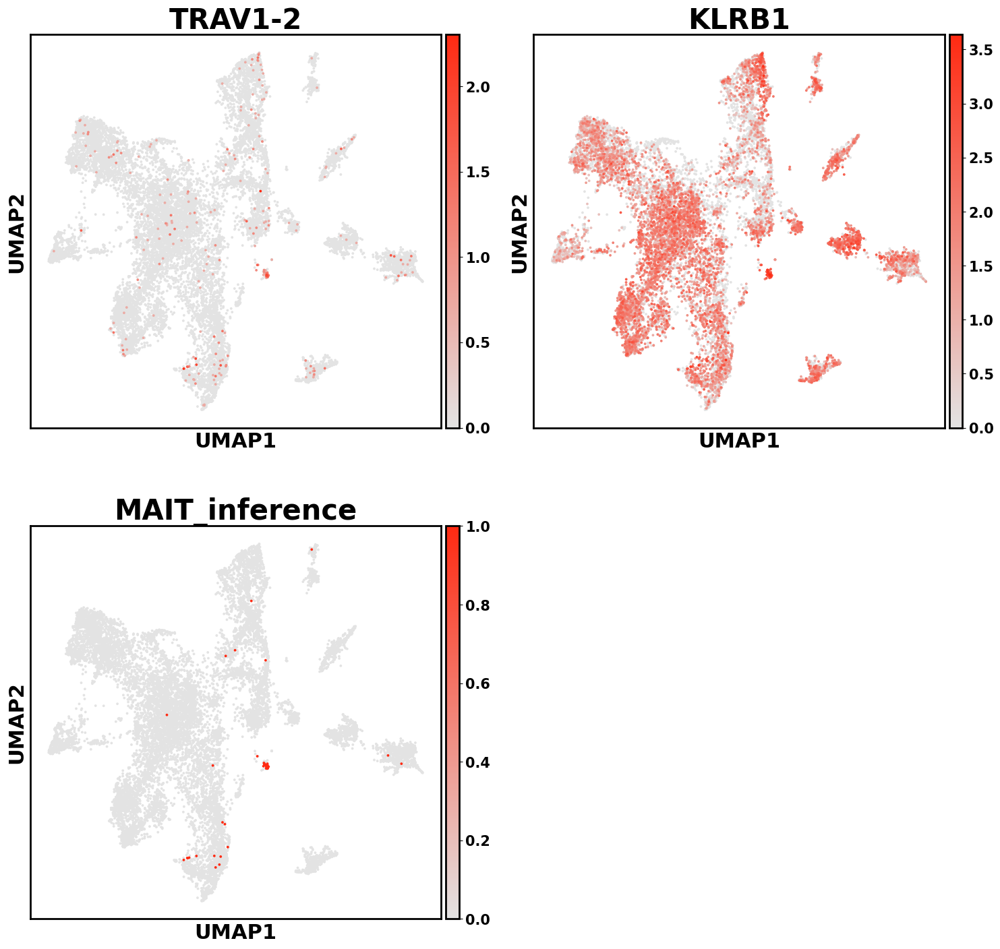

In [105]:
plt.close()
fig = sc.pl.umap(adata, color =['TRAV1-2','KLRB1','MAIT_inference'],ncols = 2,size = 30, legend_loc = 'on data', palette  = my_palette, cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('MAIT.png') 

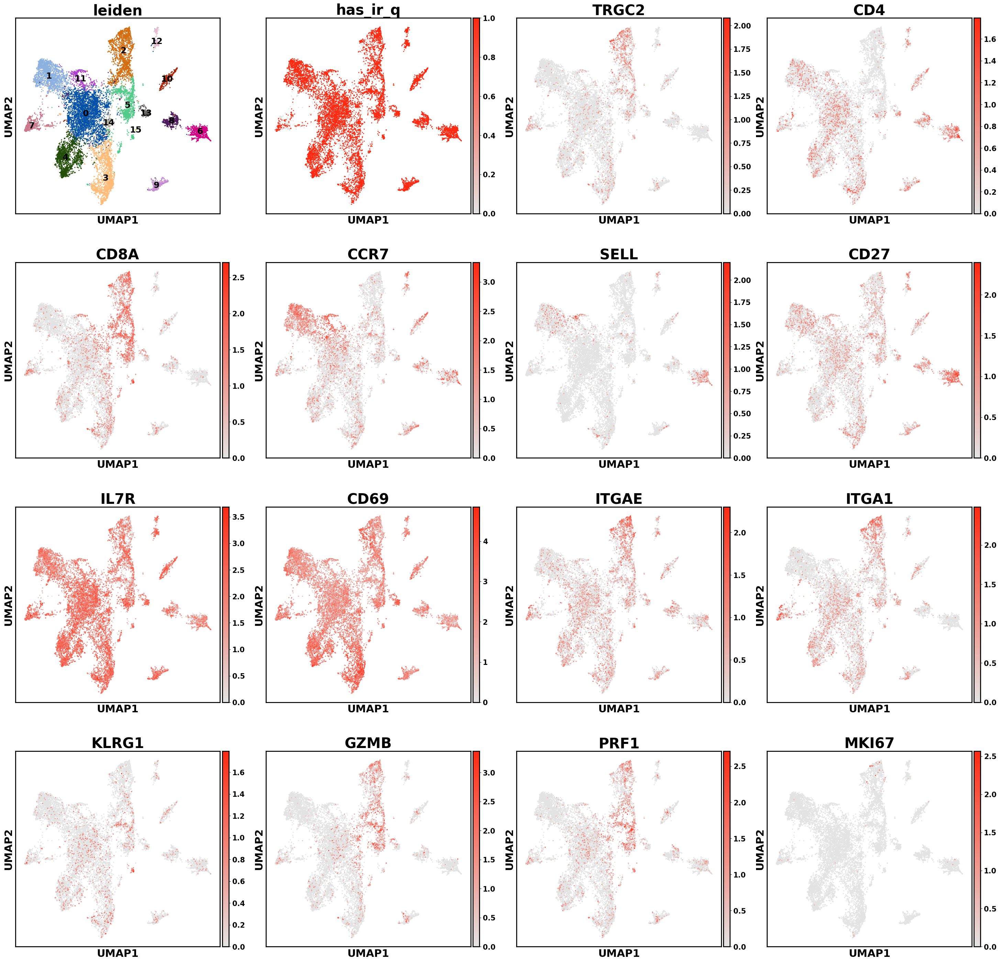

In [106]:
%matplotlib inline
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','has_ir_q','TRGC2','CD4','CD8A','CCR7','SELL','CD27','IL7R','CD69','ITGAE','ITGA1','KLRG1','GZMB','PRF1','MKI67'],
                 size =20, ncols = 4, cmap = my_cmap, return_fig = True, legend_loc = 'on data',legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')

#FAS = CD95, SELL = CD62L, TCF7 = TCF-1, IL7R = CD127, KLRB1 = CD161, KLRD1 = CD 94, CD39 = ENTPD1
#RORC = RORrt, TBX21 = T-bet, ZNF683 = hobit ITGA1 = CD49a; ITGAE = CD103; SPN = CD43; PTPRC = CD45RA

### Subcluster

Idea here is to first try separate phenotypically different cells

running Leiden clustering
    finished: found 18 clusters and added
    'leiden2', the cluster labels (adata.obs, categorical) (0:00:00)


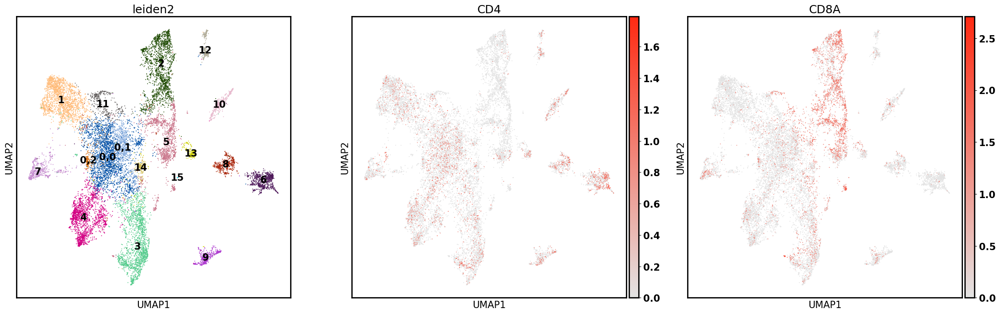

In [110]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden', ['0']), resolution = 0.25, key_added= 'leiden2')
sc.pl.umap(adata, color=['leiden2','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 20 clusters and added
    'leiden3', the cluster labels (adata.obs, categorical) (0:00:00)


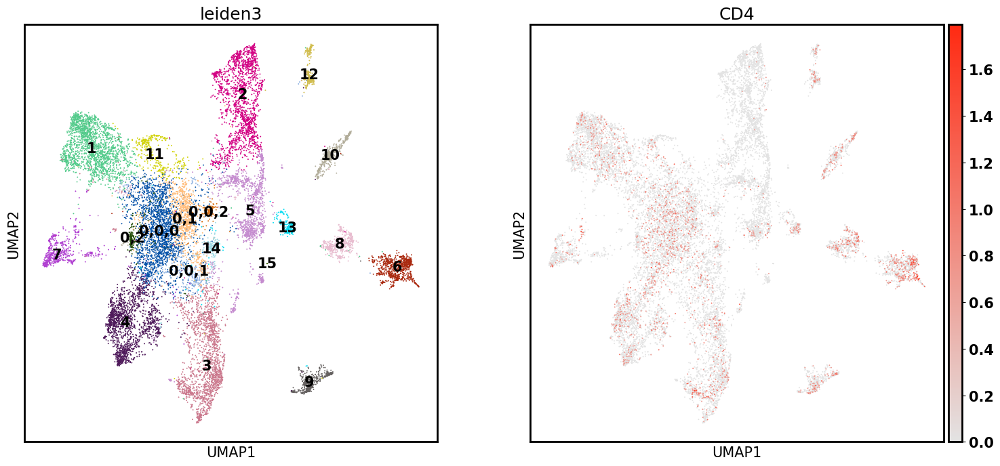

In [115]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden2', ['0,0']), resolution = 0.28, key_added= 'leiden3')
sc.pl.umap(adata, color=['leiden3','CD4'], legend_loc = 'on data', cmap = my_cmap, palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 27 clusters and added
    'leiden4', the cluster labels (adata.obs, categorical) (0:00:00)


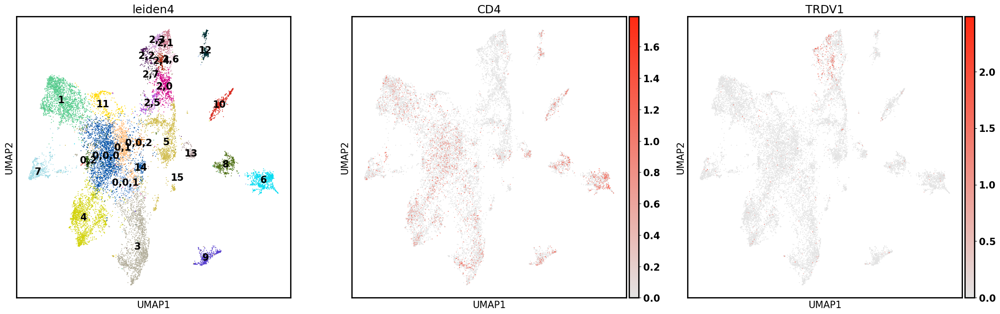

In [248]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden3', ['2']), resolution = 0.6, key_added= 'leiden4')
sc.pl.umap(adata, color=['leiden4','CD4','TRDV1'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 30 clusters and added
    'leiden5', the cluster labels (adata.obs, categorical) (0:00:00)


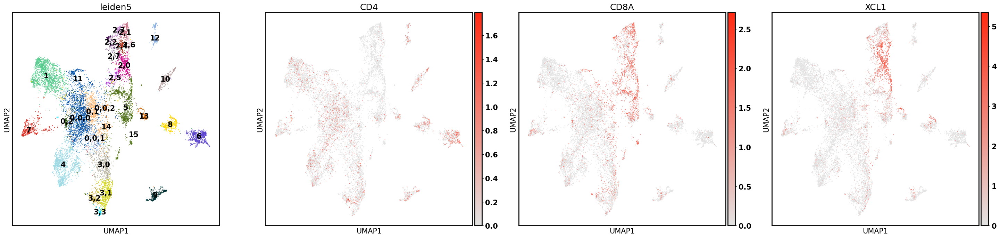

In [249]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden4', ['3']), resolution = 0.35, key_added= 'leiden5')
sc.pl.umap(adata, color=['leiden5','CD4','CD8A','XCL1'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 31 clusters and added
    'leiden6', the cluster labels (adata.obs, categorical) (0:00:00)


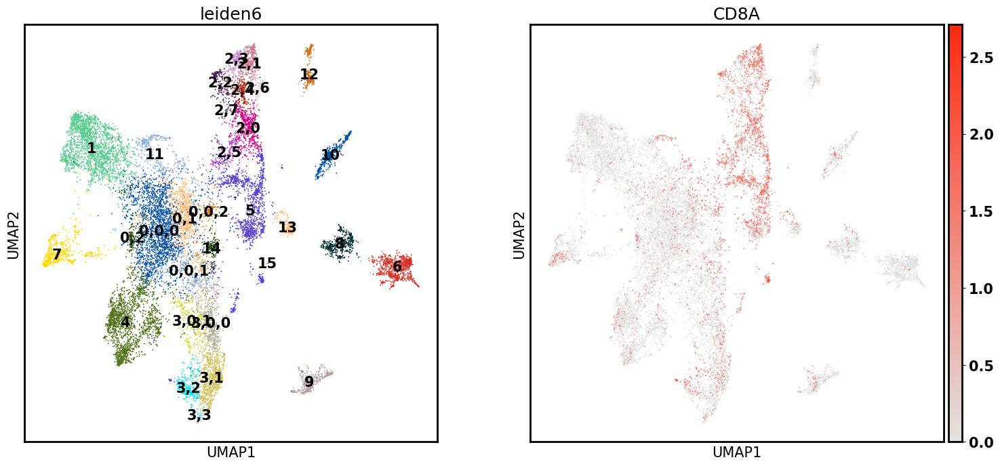

In [250]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden5', ['3,0']), resolution = 0.3, key_added= 'leiden6')
sc.pl.umap(adata, color=['leiden6','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 32 clusters and added
    'leiden7', the cluster labels (adata.obs, categorical) (0:00:00)


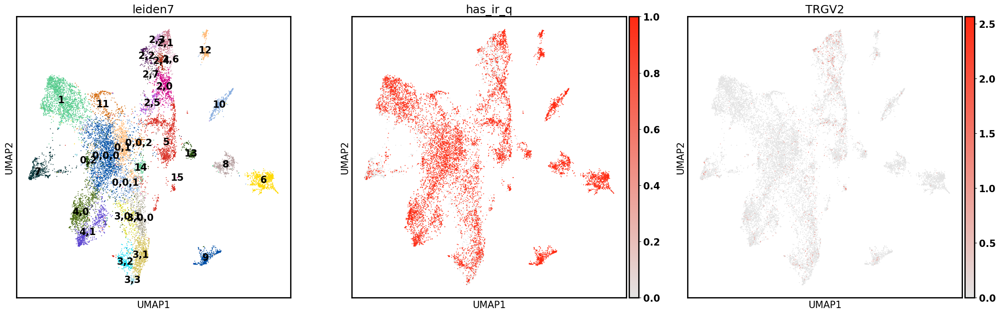

In [251]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden6', ['4']), resolution = 0.3, key_added= 'leiden7')
sc.pl.umap(adata, color=['leiden7','has_ir_q','TRGV2'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 34 clusters and added
    'leiden8', the cluster labels (adata.obs, categorical) (0:00:00)


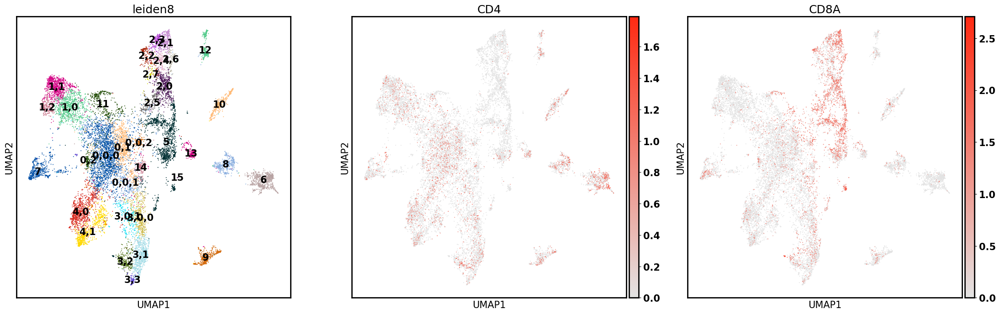

In [252]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden7', ['1']), resolution = 0.28, key_added= 'leiden8')
sc.pl.umap(adata, color=['leiden8','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 38 clusters and added
    'leiden9', the cluster labels (adata.obs, categorical) (0:00:00)


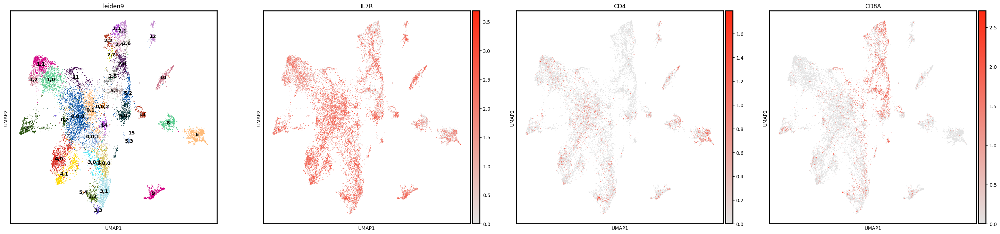

In [340]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden8', ['5']), resolution = 0.3, key_added= 'leiden9')
sc.pl.umap(adata, color=['leiden9','IL7R','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 41 clusters and added
    'leiden10', the cluster labels (adata.obs, categorical) (0:00:00)


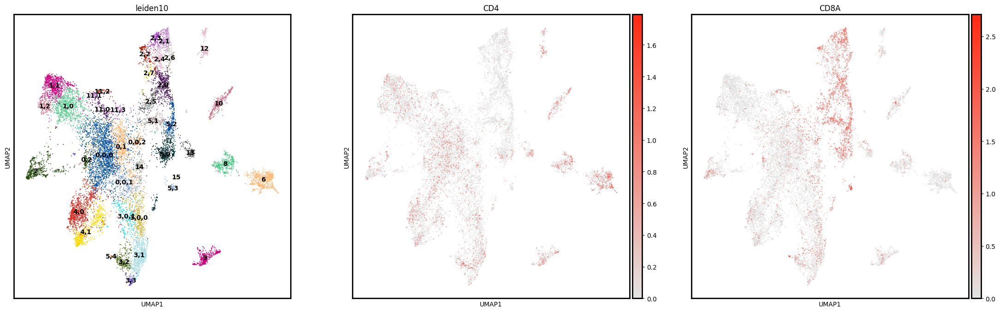

In [341]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden9', ['11']), resolution = 0.5, key_added= 'leiden10')
sc.pl.umap(adata, color=['leiden10','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 44 clusters and added
    'leiden11', the cluster labels (adata.obs, categorical) (0:00:00)


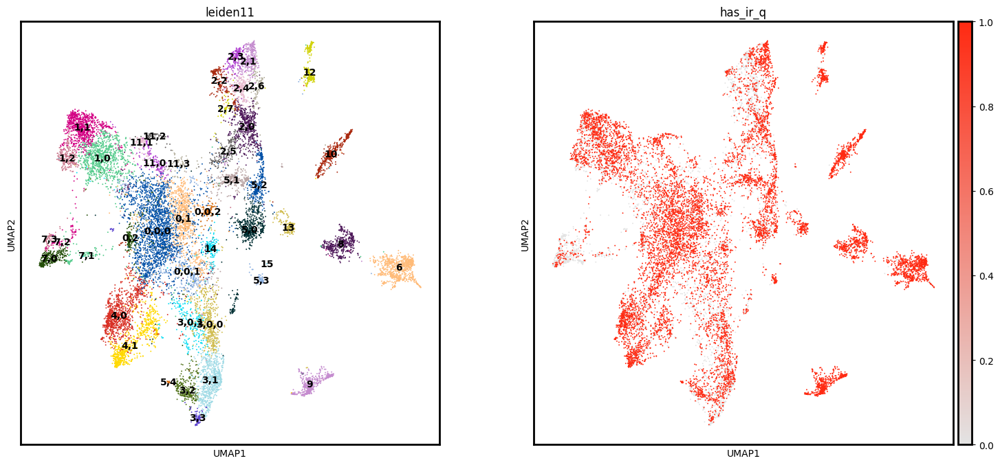

In [342]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden10', ['7']), resolution = 0.25, key_added= 'leiden11')
sc.pl.umap(adata, color=['leiden11','has_ir_q'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 45 clusters and added
    'leiden12', the cluster labels (adata.obs, categorical) (0:00:00)


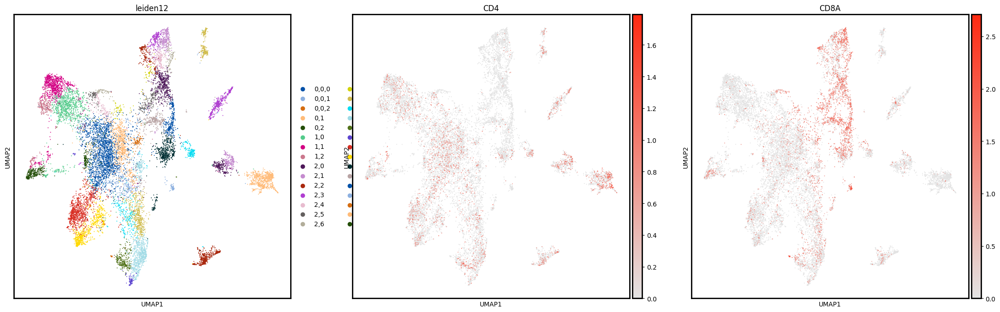

In [343]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden11', ['8']), resolution = 0.3, key_added= 'leiden12')
sc.pl.umap(adata, color=['leiden12','CD4','CD8A'], cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 46 clusters and added
    'leiden13', the cluster labels (adata.obs, categorical) (0:00:00)


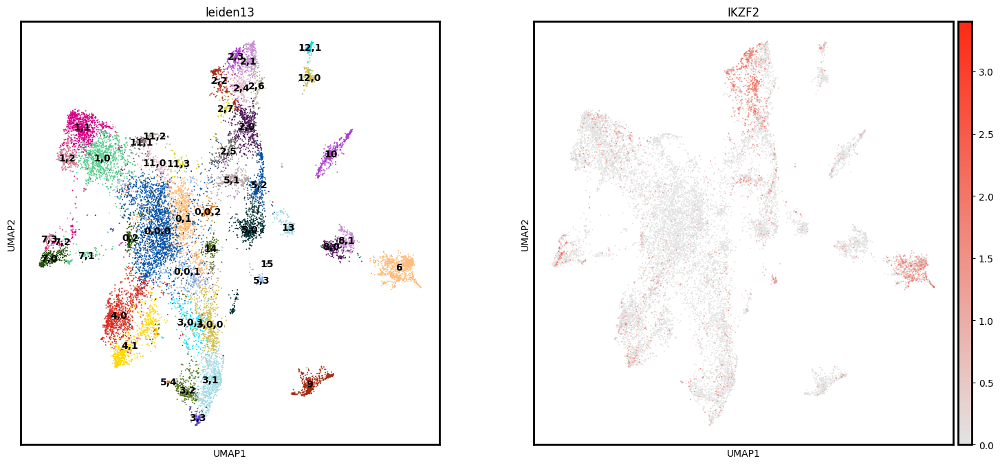

In [351]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden12', ['12']), resolution = 0.3, key_added= 'leiden13')
sc.pl.umap(adata, color=['leiden13','IKZF2'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 47 clusters and added
    'leiden14', the cluster labels (adata.obs, categorical) (0:00:00)


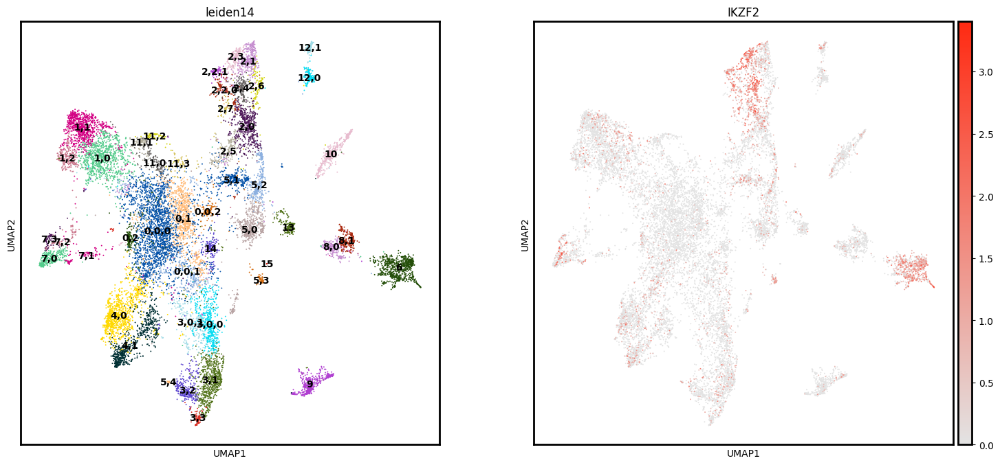

In [358]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden13', ['2,2']), resolution = 0.2, key_added= 'leiden14')
sc.pl.umap(adata, color=['leiden14','IKZF2'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 48 clusters and added
    'leiden15', the cluster labels (adata.obs, categorical) (0:00:00)


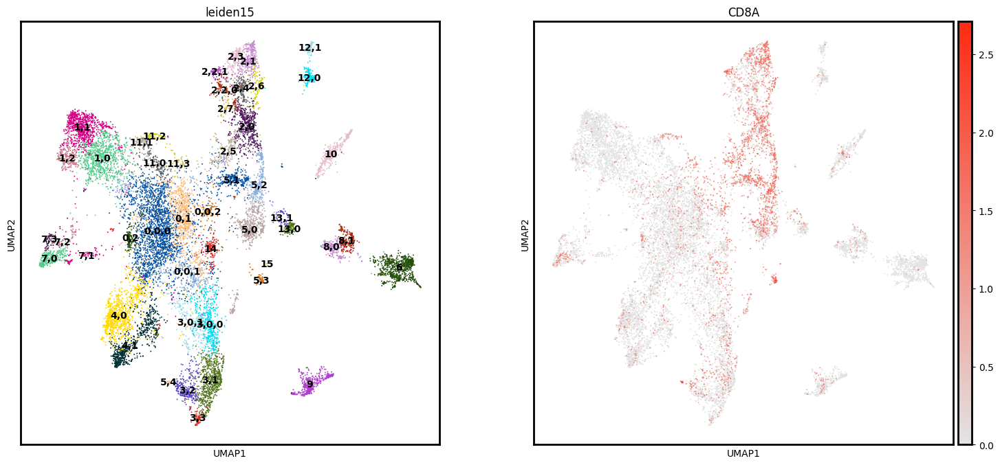

In [360]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden14', ['13']), resolution = 0.3, key_added= 'leiden15')
sc.pl.umap(adata, color=['leiden15','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

In [361]:
adata.obs['cluster_blind'] = adata.obs.groupby('leiden15').ngroup().astype('str')

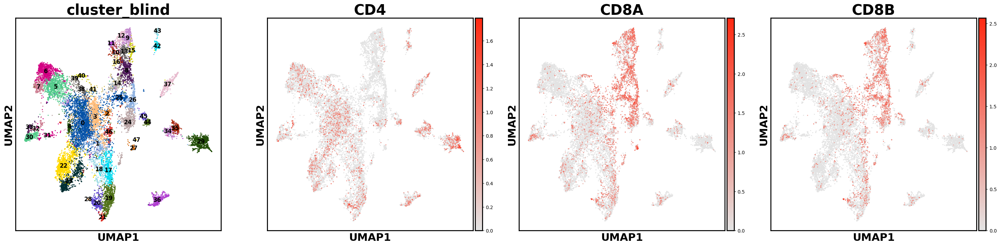

In [362]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['cluster_blind','CD4','CD8A','CD8B'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large',palette = my_palette)
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_48.png')

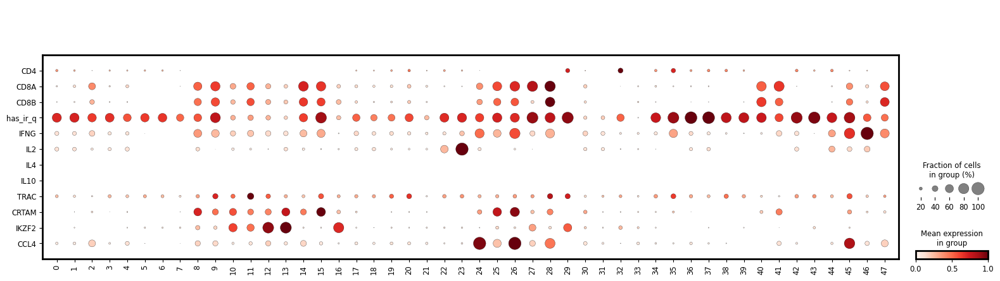

In [363]:
sc.pl.dotplot(adata,['CD4','CD8A','CD8B','has_ir_q','IFNG','IL2','IL4','IL10','TRAC','CRTAM','IKZF2','CCL4'],groupby = 'cluster_blind' , vmax = 1, swap_axes = True, dot_min =0.05, dot_max =1,standard_scale = 'var')

In [ ]:
adata.obs['general type'] = adata.obs['cluster_blind']
adata.obs['general type'] = adata.obs['general type'].astype('str')
gd = [10, 16, 12, 13]
gd = [str(i) for i in gd]

cd8abs = ['11',
 '14',
 '15',
 '2',
 '24',
 '25',
 '26',
 '28',
 '40',
 '41',
 '45',
 '47',
 '8',
 '9']
cd8aas = ['27']

unconventional = [30, 21, 31, 33]
unconventional = [str(i) for i in unconventional]

for c_id in set(adata.obs['cluster_blind']):
    if c_id in gd:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRgd'}})
    elif c_id in cd8abs:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRab CD8ab'}})
    elif c_id in cd8aas:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRab CD8aa'}})
    elif c_id in unconventional:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'Unconventional'}})    
    else:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRab CD4'}})
adata.obs['general type'] = adata.obs['general type'].astype('category')

In [ ]:
adata.obs['general subtype'] = adata.obs['cluster_blind']
adata.obs['general subtype'] = adata.obs['general subtype'].astype('str')


for c_id in set(adata.obs['cluster_blind']):
    if c_id in ['29']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'FOXP3+ Treg'}})
    elif c_id in ['40','41']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'TCM'}})
    elif c_id in ['30', '21', '31', '33']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Lymphocytes'}})
    elif c_id in ['38','39']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Naive/TCM'}})
    elif c_id in ['5','6','7','43']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Poised TCM'}})
    elif c_id in ['25','26','24','28']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'TEM'}})
    elif c_id in ['34','35']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Tph'}})
    elif c_id in ['37', '36', '32']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Mobile TRM'}})
    elif c_id in ['27']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'MAIT'}})
    else:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'TRM'}})
adata.obs['general subtype'] = adata.obs['general subtype'].astype('category')

In [ ]:
adata.obs['celltype'] = adata.obs['general type'].astype(str).map(str)+' '+ adata.obs['general subtype'].astype(str).map(str)

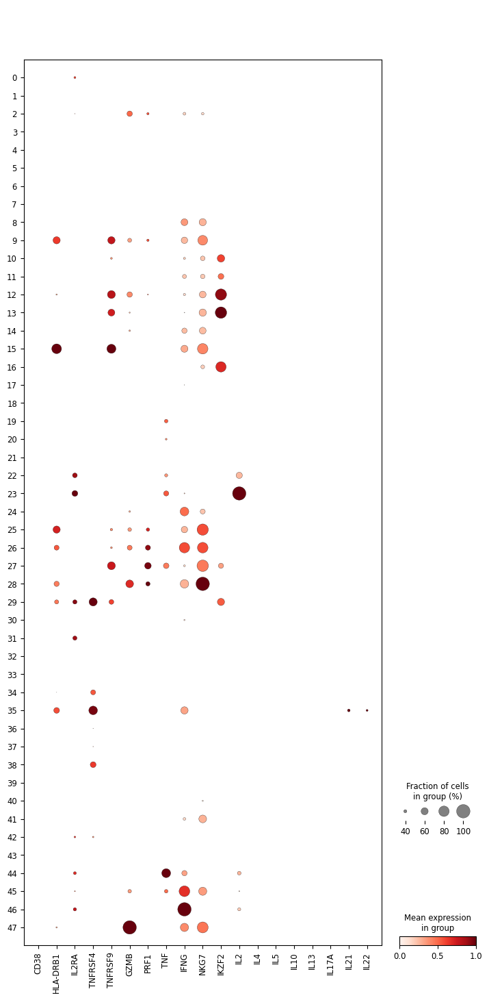

In [ ]:
plt.rcParams.update({'font.size': 5, 'font.weight': 'heavy','axes.linewidth':5})
plt.rcParams.update(plt.rcParamsDefault)


sc.pl.dotplot(adata,['CD38','HLA-DRB1',
                     'IL2RA', 'TNFRSF4','TNFRSF9', 'GZMB', 'PRF1', 'TNF', 'IFNG', 'NKG7',
       'IKZF2','IL2', 'IL4', 'IL5', 'IL10', 'IL13', 'IL17A',
       'IL21', 'IL22'],groupby = 'cluster_blind' , vmax = 1, 
              swap_axes = False ,dot_min = 0.3,standard_scale = 'var', save= 'activation.png')
# Checked IL9, nothing

In [ ]:
adata.obs['activation'] = adata.obs['cluster_blind']
adata.obs['activation'] = adata.obs['activation'].astype('str')
rest = [0,1,3,4,5,6,7,17,18,21,31,32,33,34,36,37,39,42,43]
rest = [str(i) for i in rest]

for c_id in set(adata.obs['cluster_blind']):
    if c_id in rest:
        adata.obs = adata.obs.replace({'activation' : { c_id: 'rest'}})
    else:
        adata.obs = adata.obs.replace({'activation' : { c_id: 'act'}})
adata.obs['activation'] = adata.obs['activation'].astype('category')